In [78]:
#!pip install fklearn

In [79]:
#!pip install shap

In [45]:
#Import de bibliotecas
import pandas as pd
import fklearn
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import shap
%matplotlib inline
#shap.initjs()

In [46]:
#Leitura do dataframe rain_data_aus
df=pd.read_csv('rain_data_aus.csv')
df.head()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,humidity9am,humidity3pm,pressure9am,...,temp9am,temp3pm,raintoday,amountOfRain,raintomorrow,temp,humidity,precipitation3pm,precipitation9am,modelo_vigente
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,71.0,22.0,1007.7,...,16.9,21.8,No,0.0,No,29.48,28.400000,12,5.115360,0.089825
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,44.0,25.0,1010.6,...,17.2,24.3,No,0.0,No,32.12,2.208569,10,21.497100,0.023477
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,38.0,30.0,1007.6,...,21.0,23.2,No,0.0,No,32.84,38.000000,17,20.782859,0.027580
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,45.0,16.0,1017.6,...,18.1,26.5,No,1.0,No,35.60,21.200000,8,12.028646,0.023962
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,82.0,33.0,1010.8,...,17.8,29.7,No,0.2,No,40.76,41.600000,9,11.883546,0.220164


In [47]:
#Lendo dataframes de vento
df1 = pd.DataFrame()
for i in range(1, 9):
    df_ = pd.read_csv(f'wind_table_0{i}.csv')
    df_.columns = [col.replace("_", "") for col in df_.columns]
    df1 = pd.concat([df1, df_])
    print(df1.shape)
print(df1.shape)
df1.head()

(20000, 8)
(40000, 8)
(60000, 8)
(80000, 8)
(100000, 8)
(120000, 8)
(142193, 8)
(164386, 8)
(164386, 8)


,date,location,windgustdir,windgustspeed,winddir9am,winddir3pm,windspeed9am,windspeed3pm
0,2007-11-01,Canberra,NW,30.0,SW,NW,6.0,20.0
1,2007-11-02,Canberra,ENE,39.0,E,W,4.0,17.0
2,2007-11-03,Canberra,NW,85.0,N,NNE,6.0,6.0
3,2007-11-04,Canberra,NW,54.0,WNW,W,30.0,24.0
4,2007-11-05,Canberra,SSE,50.0,SSE,ESE,20.0,28.0


In [48]:
#Drop de duplicatas e união dos dataframes
df1=df1.drop_duplicates().reset_index(drop=True)
df=df.merge(df1,on=['date','location'])
print(len(df.columns))
df.head()

29


,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,humidity9am,humidity3pm,pressure9am,...,humidity,precipitation3pm,precipitation9am,modelo_vigente,windgustdir,windgustspeed,winddir9am,winddir3pm,windspeed9am,windspeed3pm
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,71.0,22.0,1007.7,...,28.400000,12,5.115360,0.089825,W,44.0,W,WNW,20.0,24.0
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,44.0,25.0,1010.6,...,2.208569,10,21.497100,0.023477,WNW,44.0,NNW,WSW,4.0,22.0
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,38.0,30.0,1007.6,...,38.000000,17,20.782859,0.027580,WSW,46.0,W,WSW,19.0,26.0
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,45.0,16.0,1017.6,...,21.200000,8,12.028646,0.023962,NE,24.0,SE,E,11.0,9.0
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,82.0,33.0,1010.8,...,41.600000,9,11.883546,0.220164,W,41.0,ENE,NW,7.0,20.0


In [49]:
#Verificando nan values
(df.isna().sum()/len(df)).round(2).sort_values(ascending=False)

sunshine            0.48
evaporation         0.43
cloud3pm            0.40
cloud9am            0.38
pressure9am         0.10
pressure3pm         0.10
winddir9am          0.07
windgustspeed       0.07
windgustdir         0.07
winddir3pm          0.03
humidity3pm         0.03
humidity            0.03
windspeed3pm        0.02
temp3pm             0.02
windspeed9am        0.01
temp9am             0.01
raintoday           0.01
humidity9am         0.01
rainfall            0.01
amountOfRain        0.00
raintomorrow        0.00
temp                0.00
precipitation3pm    0.00
precipitation9am    0.00
modelo_vigente      0.00
maxtemp             0.00
mintemp             0.00
location            0.00
date                0.00
dtype: float64

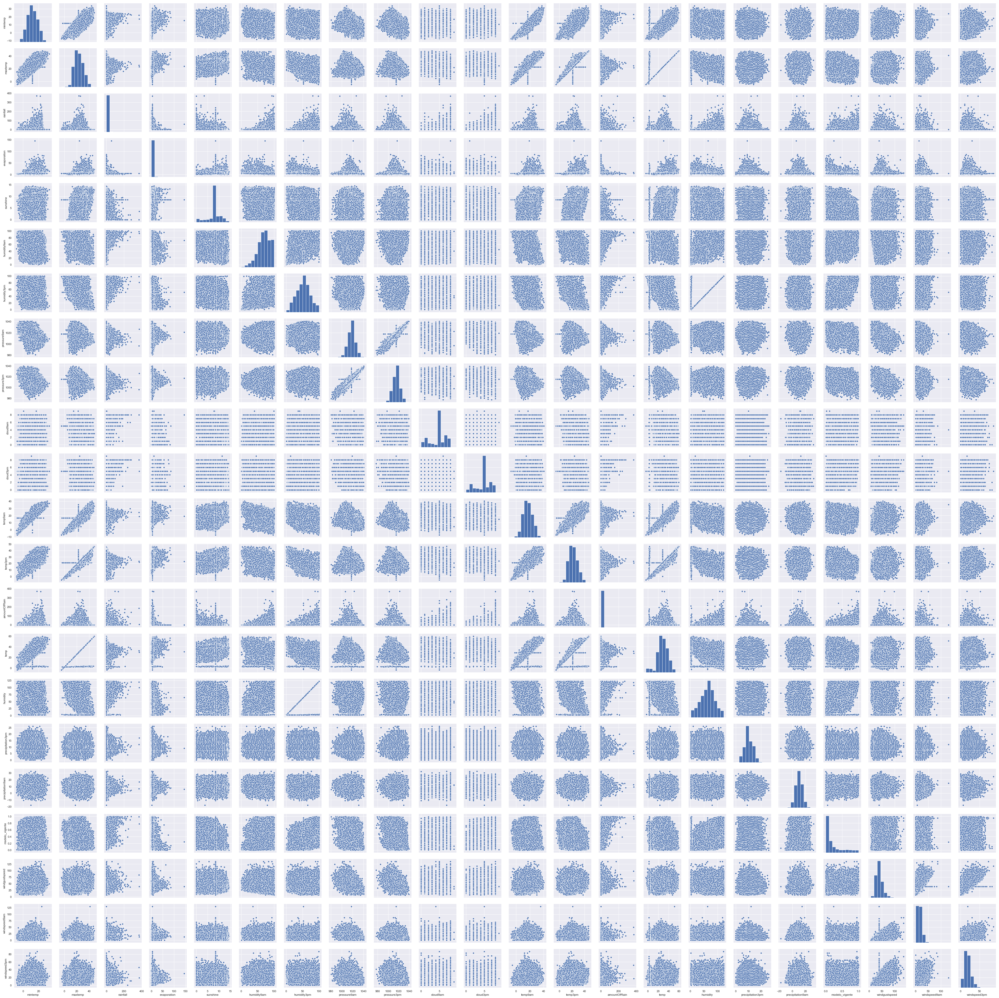

In [44]:
#Visão geral de relação entre as features (demora para rodar)
sns.pairplot(df)

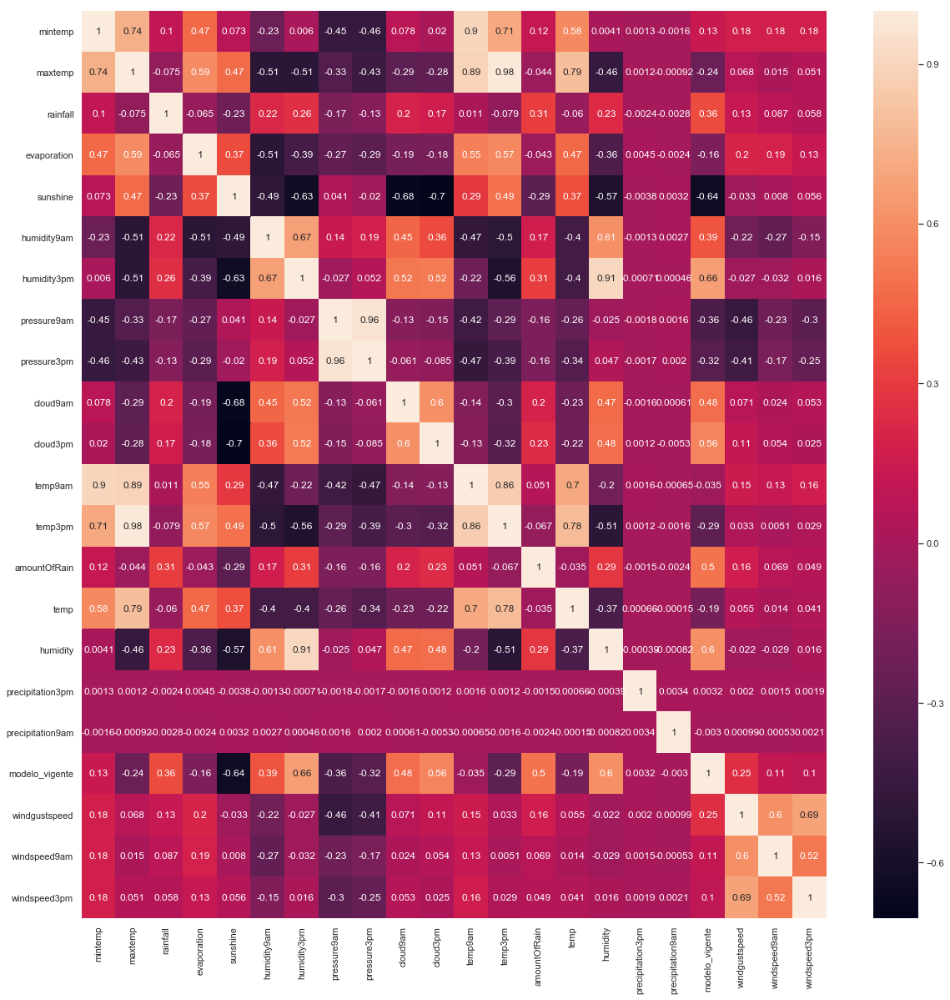

In [50]:
#Heatmap de correlações
fig, ax = plt.subplots(figsize=(20, 20))
sns.set()
sns.heatmap(df.corr(),annot=True)

C:\Users\veren\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


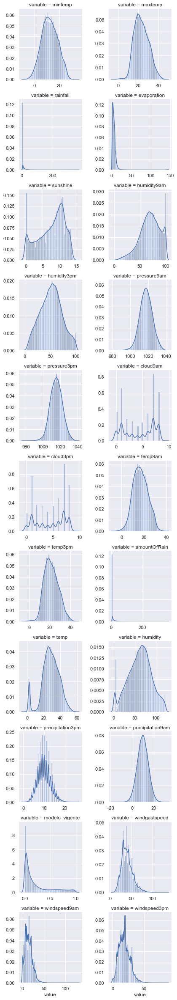

In [51]:
#Analisando a distribuição das variáveis numéricas
f = pd.melt(df, value_vars=df.select_dtypes(include=[np.number]).columns)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False)
g = g.map(sns.distplot, "value")

In [52]:
#Criarei a variável mean_temp, média das temperaturas
col = df.loc[: , ['mintemp','maxtemp','temp','temp3pm','temp9am']]
df['mean_temp'] = col.mean(axis=1)

#Mesmo para variável precipitation
#col = df.loc[: , ['precipitation3pm', 'precipitation9am']]
#dfnum['mean_precipitation'] = col.mean(axis=1)

#Mesmo para variável windspeed
#col = df.loc[: , ['windspeed9am', 'windspeed3pm']]
#dfnum['mean_windspeed'] = col.mean(axis=1)

#Mesmo para variável pressure
#col = df.loc[: , ['pressure9am', 'pressure3pm']]
#dfnum['mean_pressure'] = col.mean(axis=1)
df.head()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,humidity9am,humidity3pm,pressure9am,...,precipitation3pm,precipitation9am,modelo_vigente,windgustdir,windgustspeed,winddir9am,winddir3pm,windspeed9am,windspeed3pm,mean_temp
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,71.0,22.0,1007.7,...,12,5.115360,0.089825,W,44.0,W,WNW,20.0,24.0,20.896
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,44.0,25.0,1010.6,...,10,21.497100,0.023477,WNW,44.0,NNW,WSW,4.0,22.0,21.224
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,38.0,30.0,1007.6,...,17,20.782859,0.027580,WSW,46.0,W,WSW,19.0,26.0,23.128
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,45.0,16.0,1017.6,...,8,12.028646,0.023962,NE,24.0,SE,E,11.0,9.0,23.480
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,82.0,33.0,1010.8,...,9,11.883546,0.220164,W,41.0,ENE,NW,7.0,20.0,27.612


In [55]:
#Função temporal para divisão em treino e teste
from fklearn.preprocessing.splitting import time_split_dataset
split_fn = time_split_dataset(time_column = 'date',
                              train_start_date = '2007-01-01',
                              train_end_date = '2014-12-31',
                              holdout_end_date = '2018-01-01')

In [56]:
#Split em treino e teste
train_df, test_df = split_fn(df)
train_df = train_df.reset_index(drop = True)
test_df = test_df.reset_index(drop = True)
print(train_df.shape)
print(test_df.shape)

(98940, 27)
(43253, 27)


In [57]:
#Modelagem
#Split de dados no ano de 2012
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.pipeline import Pipeline
from fklearn.validation.splitters import out_of_time_and_space_splitter
#KFold
kfold_fn = out_of_time_and_space_splitter(n_splits=5,
                                          in_time_limit='2012-12-31',
                                          time_column='date',
                                          space_column='location')

In [58]:
#Features e labels
features_target='raintomorrow'
features_train=[x for x in train_df.columns if x not in ['raintomorrow', "date", "location"]]

In [64]:
#Tratamento de variaveis categoricas e numericas
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.base import TransformerMixin
from sklearn.model_selection import KFold
from sklearn.feature_selection import SelectKBest, f_classif,chi2

#Features numéricas
numeric_features = train_df.select_dtypes(include=[np.number]).columns

#Features categóricas
categorical_features = [c for c in train_df.select_dtypes(include=[object]).columns if c not in ['raintomorrow', "date", "location"]]

#Fillna e ordinal encoder para features categóricas
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy = 'constant', fill_value = 'missing')),
    ('ordinal_encoder', OrdinalEncoder())])

#Fill_value com valor destoando dos valores em geral para não atrapalhar no fitting do modelo
preprocessor = ColumnTransformer(
    transformers=[('num', SimpleImputer(strategy='constant', fill_value = 999999), numeric_features),
                  ('cat', categorical_transformer, categorical_features)])

# Append classifier to preprocessing pipeline.
# Pipeline com encoding de variaveis, feature selector e modelo preditivo
clf_ = Pipeline(steps=[('preprocessor', preprocessor),
                      ('skb',SelectKBest(score_func = f_classif, k = 5)),
                      ('rfc', RandomForestClassifier())])

In [65]:
#train_df.date=pd.to_datetime(train_df.date)

clf=GridSearchCV(estimator=clf_,
                 cv=KFold(5, shuffle=True),
                 param_grid=[{'rfc__n_estimators':[10,50,100,120],'rfc__max_depth':range(1,6)}],
                 scoring="roc_auc",
                 verbose = 5)

clf.fit(train_df[features_train],train_df[features_target])

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] rfc__max_depth=1, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=10, score=1.000, total=   0.5s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV] rfc__max_depth=1, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=10, score=1.000, total=   0.5s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s


[CV] rfc__max_depth=1, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=10, score=1.000, total=   0.5s


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s remaining:    0.0s


[CV] rfc__max_depth=1, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=10, score=1.000, total=   0.5s


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.1s remaining:    0.0s


[CV] rfc__max_depth=1, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=10, score=0.991, total=   0.5s
[CV] rfc__max_depth=1, rfc__n_estimators=50 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=50, score=1.000, total=   1.1s
[CV] rfc__max_depth=1, rfc__n_estimators=50 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=50, score=1.000, total=   1.1s
[CV] rfc__max_depth=1, rfc__n_estimators=50 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=50, score=1.000, total=   1.0s
[CV] rfc__max_depth=1, rfc__n_estimators=50 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=50, score=1.000, total=   1.1s
[CV] rfc__max_depth=1, rfc__n_estimators=50 ..........................
[CV]  rfc__max_depth=1, rfc__n_estimators=50, score=1.000, total=   1.0s
[CV] rfc__max_depth=1, rfc__n_estimators=100 .........................
[CV]  rfc__max_depth=1, rfc__n_estimators=100, score=1.000, total

[CV]  rfc__max_depth=4, rfc__n_estimators=10, score=1.000, total=   0.6s
[CV] rfc__max_depth=4, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=4, rfc__n_estimators=10, score=1.000, total=   0.6s
[CV] rfc__max_depth=4, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=4, rfc__n_estimators=10, score=1.000, total=   0.5s
[CV] rfc__max_depth=4, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=4, rfc__n_estimators=10, score=1.000, total=   0.6s
[CV] rfc__max_depth=4, rfc__n_estimators=10 ..........................
[CV]  rfc__max_depth=4, rfc__n_estimators=10, score=1.000, total=   0.6s
[CV] rfc__max_depth=4, rfc__n_estimators=50 ..........................
[CV]  rfc__max_depth=4, rfc__n_estimators=50, score=1.000, total=   1.2s
[CV] rfc__max_depth=4, rfc__n_estimators=50 ..........................
[CV]  rfc__max_depth=4, rfc__n_estimators=50, score=1.000, total=   1.2s
[CV] rfc__max_depth=4, rfc__n_estimators=50 ...................

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  2.6min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         SimpleImputer(add_indicator=False,
                                                                                       copy=True,
                                                                                       fill_value=999999,
                                                                                  

In [66]:
pd.DataFrame(clf.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_rfc__max_depth,param_rfc__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.451605,0.007665,0.076795,0.001895,1,10,"{'rfc__max_depth': 1, 'rfc__n_estimators': 10}",1.000000,0.999712,0.999722,1.000000,0.991009,0.998089,3.541930e-03,20
1,0.962265,0.023490,0.108114,0.001198,1,50,"{'rfc__max_depth': 1, 'rfc__n_estimators': 50}",0.999751,0.999800,1.000000,1.000000,0.999999,0.999910,1.108656e-04,18
2,1.606943,0.024765,0.153342,0.008107,1,100,"{'rfc__max_depth': 1, 'rfc__n_estimators': 100}",1.000000,1.000000,1.000000,1.000000,0.999999,1.000000,4.030522e-07,14
3,1.857038,0.052502,0.168483,0.003002,1,120,"{'rfc__max_depth': 1, 'rfc__n_estimators': 120}",1.000000,0.999729,1.000000,0.999704,0.999556,0.999798,1.753174e-04,19
4,0.493154,0.011114,0.077313,0.002785,2,10,"{'rfc__max_depth': 2, 'rfc__n_estimators': 10}",1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.588673e-07,7
5,1.116983,0.023167,0.113740,0.003704,2,50,"{'rfc__max_depth': 2, 'rfc__n_estimators': 50}",1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.676932e-07,8
6,1.833569,0.064876,0.159584,0.005328,2,100,"{'rfc__max_depth': 2, 'rfc__n_estimators': 100}",1.000000,1.000000,1.000000,1.000000,0.999999,1.000000,2.147650e-07,9
7,2.062858,0.040410,0.175531,0.004504,2,120,"{'rfc__max_depth': 2, 'rfc__n_estimators': 120}",1.000000,1.000000,1.000000,1.000000,0.999999,1.000000,2.441849e-07,10
8,0.492441,0.007934,0.076196,0.000489,3,10,"{'rfc__max_depth': 3, 'rfc__n_estimators': 10}",1.000000,1.000000,1.000000,1.000000,0.999775,0.999955,8.981002e-05,17
9,1.153373,0.030815,0.114511,0.001467,3,50,"{'rfc__max_depth': 3, 'rfc__n_estimators': 50}",1.000000,1.000000,1.000000,1.000000,0.999999,1.000000,3.589224e-07,12


In [67]:
clf.best_estimator_

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  SimpleImputer(add_indicator=False,
                                                                copy=True,
                                                                fill_value=999999,
                                                                missing_values=nan,
                                                                strategy='constant',
                                                                verbose=0),
                                                  Index(['rainfall', 'evaporation', 'sunshine', 'humidity9am', 'humidity3pm',
       'pressure...
                 RandomForestClassifier(bootstrap=True, class_weight=N

In [68]:
#Modelo com melhor perfomance e hiperparametros
clf_ = Pipeline(steps=[('preprocessor', preprocessor),
                      ('skb',SelectKBest(score_func = f_classif, k = 5)),
                      ('rfc', RandomForestClassifier(n_estimators=10,max_depth=5))])
clf_.fit(train_df[features_train],train_df[features_target])
y_pred = clf_.predict(test_df[features_train])

In [69]:
from sklearn.metrics import roc_auc_score
roc_auc_score(test_df[features_target], clf_.predict_proba(test_df[features_train])[:, 1])

1.0

In [70]:
y_pred

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)